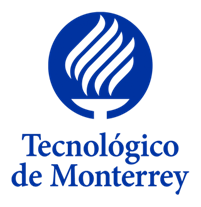

## Visión Computacional para imágenes y video (Gpo 10)
### Alumnos: 
* Armando Bringas Corpus - A01200230
* Guillermo Alfonso Muñiz Hermosillo - A01793101
* Jorge Luis Arroyo Chavelas - A01793023
* Samantha R Mancias Carrillo - A01196762
* Sofia E Mancias Carrillo - A01196563


### Profesores: 
* Dr. Gilberto Ochoa Ruiz
* Mtra. Yetnalezi Quintas Ruiz

# 9. Image Matching

## Table of Contents
1. [Libraries](#libraries)
2. [ORB Matching](#orb)
3. [SIFT Matching](#sift)
4. [Excercises with ORB and SIFT](#excercises)

    a. [Example 1](#sample1)
    
    b. [Example 2](#sample2)
    
    c. [Example 3](#sample3)
    
5. [Conclusion](#conclusion)
6. [References](#references)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

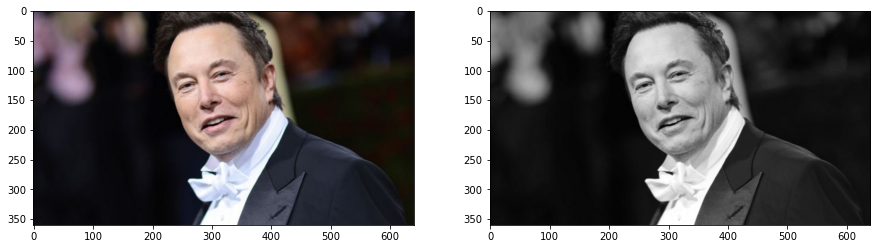

In [2]:
#reading image
img = cv2.imread('data/elon_1.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Create test image by adding Scale Invariance and Rotational Invariance

In [3]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

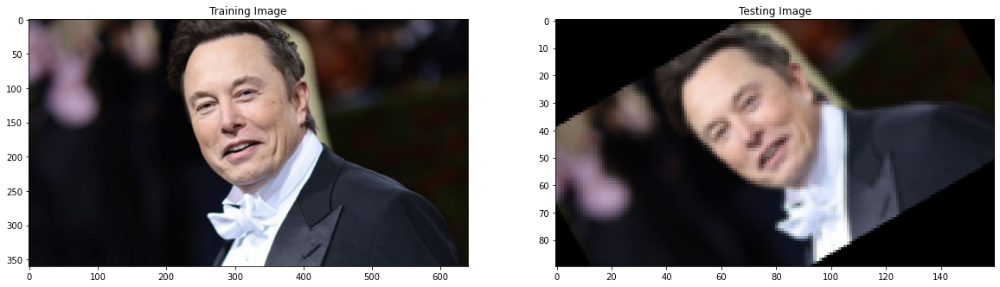

In [4]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

### ORB

In [5]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  43


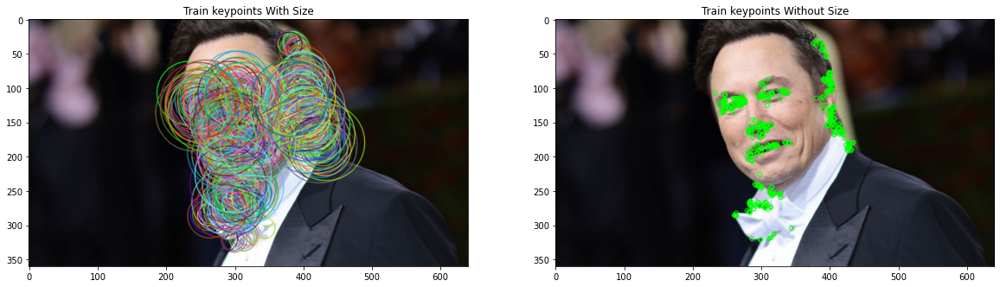

In [6]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

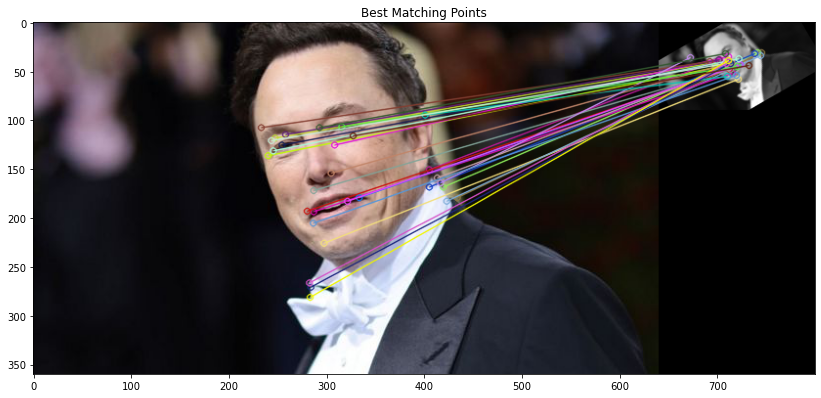


Number of Matching Keypoints Between The Training and Query Images:  30


In [7]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

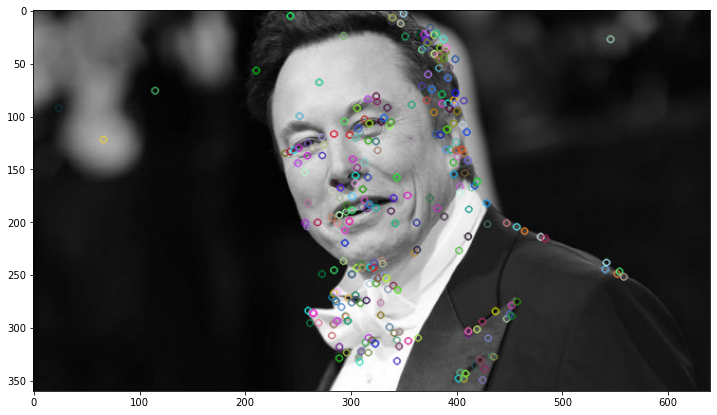

In [8]:
img1 = cv2.imread('data/elon_1.jpg')  
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

### Matching different images

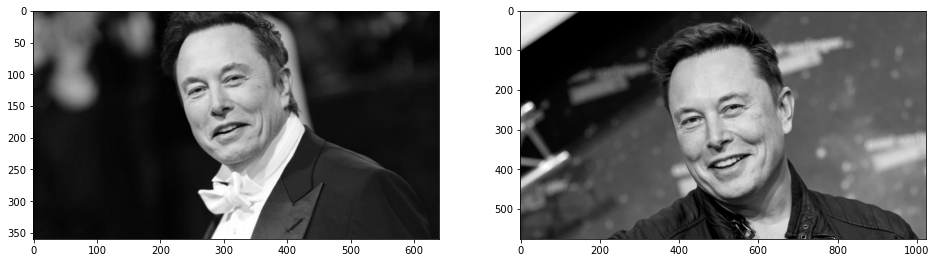

In [9]:
# read images
img1 = cv2.imread('data/elon_1.jpg')  
img2 = cv2.imread('data/elon_2.png') 

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

### Extracting Keypoints with SIFT

In [10]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(289, 734)

### Feature Matching

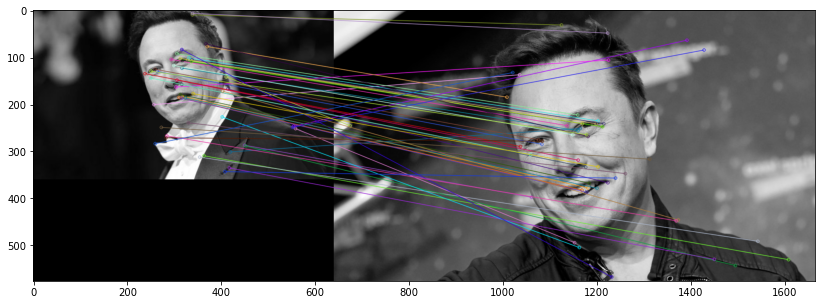

(<matplotlib.image.AxesImage at 0x15b1e882f40>, None)

In [11]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

## Excersises <a class="anchor" id="excercises" ></a>

For this exersices we test SIFT (Scale-Invariant Feature Transform) and ORB (Oriented FAST and Rotated BRIEF) algorithms that are two widely used algorithms for feature detection and extraction in computer vision.

SIFT was first introduced by David Lowe in 1999 and has since become a standard approach for detecting and describing local features in images. SIFT is invariant to scale, rotation, and affine distortion, making it robust to changes in viewpoint. SIFT works by identifying keypoints (points of interest) in an image, and then computing descriptors (vectors of feature values) that describe the appearance of the region surrounding each keypoint. These descriptors can then be used for matching features across different images. SIFT uses a scale-space representation and a Difference of Gaussians (DoG) method to identify potential keypoints. It then refines these keypoints using an algorithm known as the Scale-Invariant Feature Transform.

By the other hand, ORB was introduced by Ethan Rublee et al. in 2011 as a faster and more efficient alternative to SIFT. ORB uses the FAST algorithm to detect keypoints, which is a faster method than the scale-space extrema detection used by SIFT. It also uses the BRIEF descriptor, which is a binary descriptor that is faster to compute than the floating-point descriptors used by SIFT. ORB also includes additional steps to improve its robustness and accuracy, such as orientation assignment and descriptor modification.


As examples for the exercises we are taking three sets of different applications to test the matching in the descriptors from the SIFT and ORB algorithms: first one is matching a 2D image from a cartoon (Pikachu from Pokémon), the second is matching a face (Anne Hathaway) and third one is from the previous notebook ‘Harris Detector’ (photos from a teddy bunny). For the sake of simplicity, we wrap the code into functions to make easier to call each of the algorithms and avoid having to repeat the code.

In [12]:
# Function to plot images
def plot_images(img_1, img_2, title_1, tittle_2):
    plt.figure(figsize=([20, 20]))
    plt.subplot(121),plt.imshow(img_1)
    plt.title(title_1), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img_2)
    plt.title(tittle_2), plt.xticks([]), plt.yticks([])
    
def plot_result(img_1):
    plt.figure(figsize=([20, 20]))
    plt.axis('off')
    plt.imshow(img_1)

In [13]:
def ORB(img_color, test_gray):
    orb = cv2.ORB_create()
    train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
    test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

    keypoints_without_size = np.copy(img_color)
    keypoints_with_size = np.copy(img_color)

    cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))
    cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display image with and without keypoints size
    plot_images(keypoints_with_size, keypoints_without_size, "Train keypoints With Size", "Train keypoints Without Size")
    
    
    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))
    
    # Create a Brute Force Matcher object.
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

    # Perform the matching between the ORB descriptors of the training image and the test image
    matches = bf.match(train_descriptor, test_descriptor)

    # The matches with shorter distance are the ones we want.
    matches = sorted(matches, key = lambda x : x.distance)

    result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)
    
    return result, matches

In [14]:
def SIFT(img1, img2):
    sift = cv2.SIFT_create()
    keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)
    
    keypoints_without_size = np.copy(img1)
    keypoints_with_size = np.copy(img1)

    cv2.drawKeypoints(img1, keypoints_1, keypoints_without_size, color = (0, 255, 0))
    cv2.drawKeypoints(img1, keypoints_1, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # Display image with and without keypoints size
    plot_images(keypoints_with_size, keypoints_without_size, "Train keypoints With Size", "Train keypoints Without Size")
    
    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(keypoints_1))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(keypoints_2))

    
    #feature matching
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    matches = bf.match(descriptors_1,descriptors_2)
    matches = sorted(matches, key = lambda x:x.distance)

    img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
    
    return img3, matches

### Example 1 <a class="anchor" id="sample1" ></a>

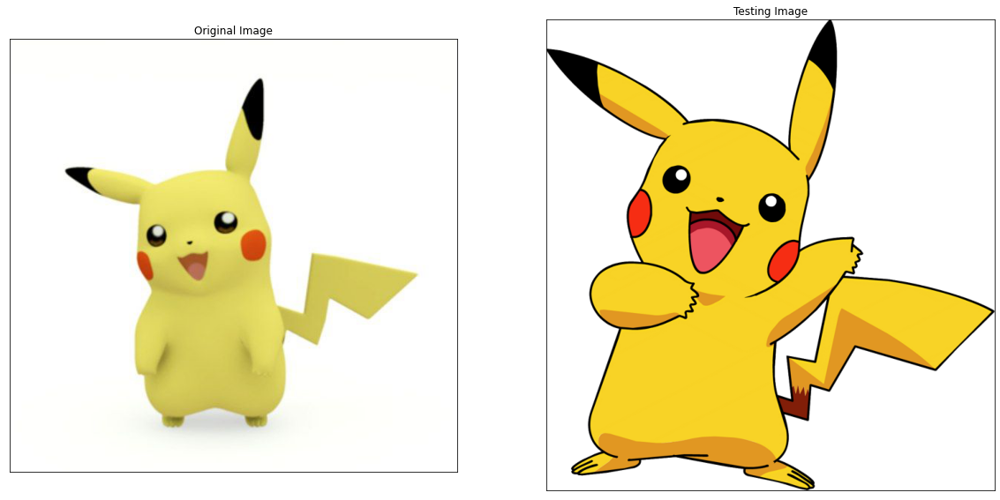

In [15]:
#reading image
img = cv2.imread('data/pikachu.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
test_image = cv2.imread('data/pikachu_2.png')
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

plot_images(img_color, test_image, "Original Image", "Testing Image")

#### Feature Matching with ORB

Number of Keypoints Detected In The Training Image:  490
Number of Keypoints Detected In The Query Image:  500


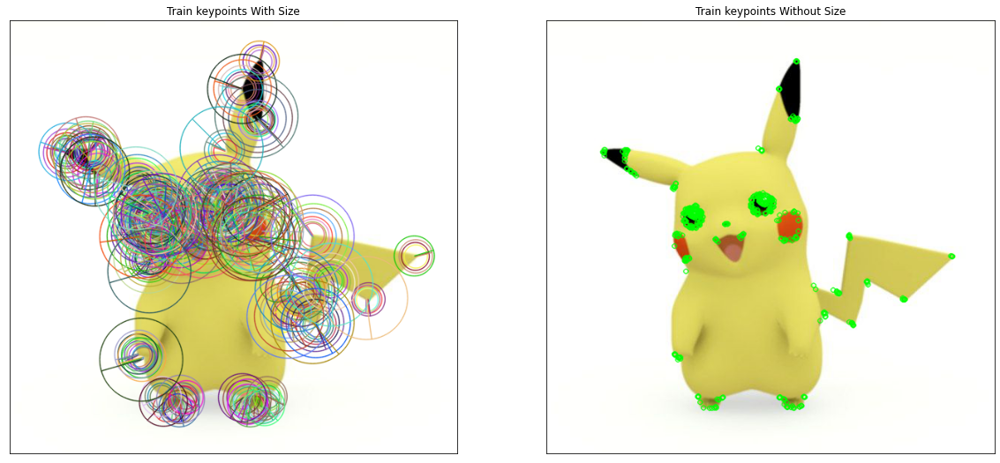

In [16]:
result, matches = ORB(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  88


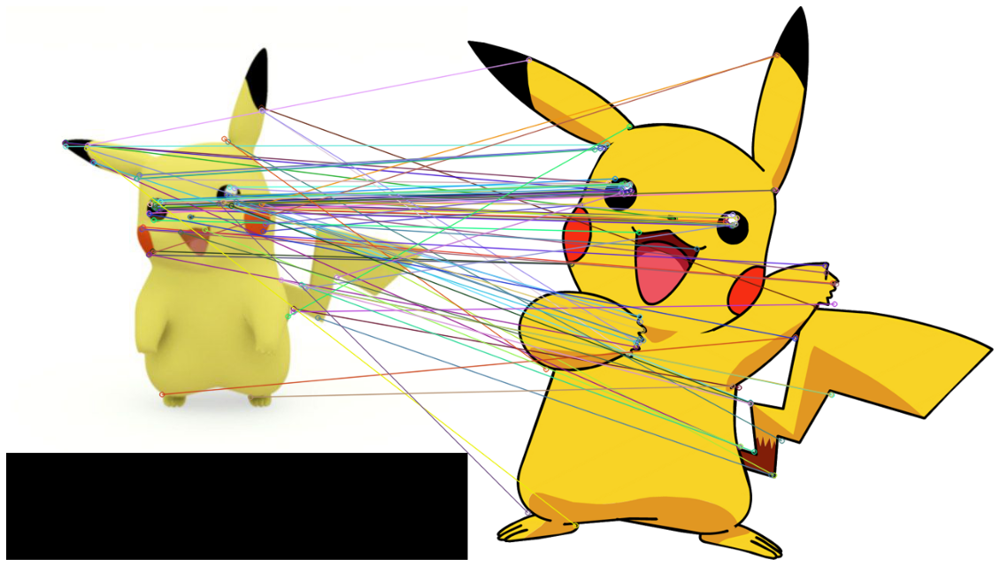

In [17]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

#### Feature Matching with SIFT

Number of Keypoints Detected In The Training Image:  81
Number of Keypoints Detected In The Query Image:  314


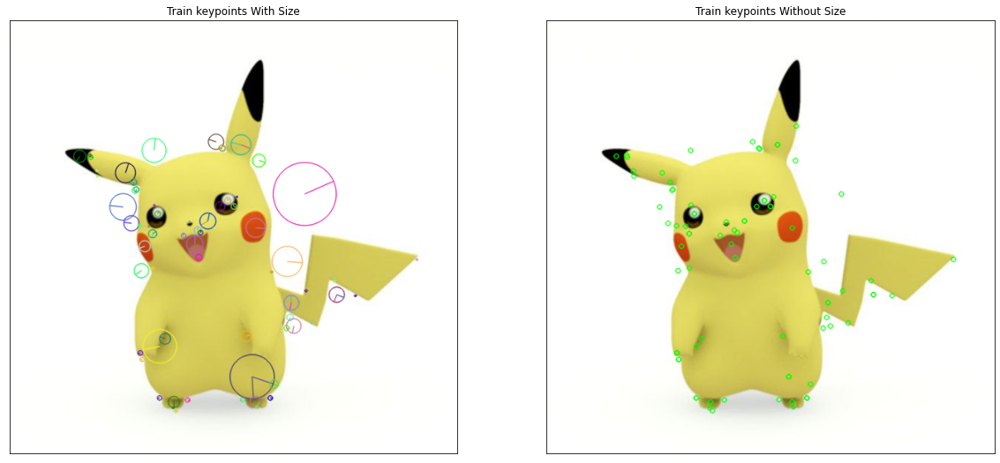

In [18]:
result, matches = SIFT(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  33


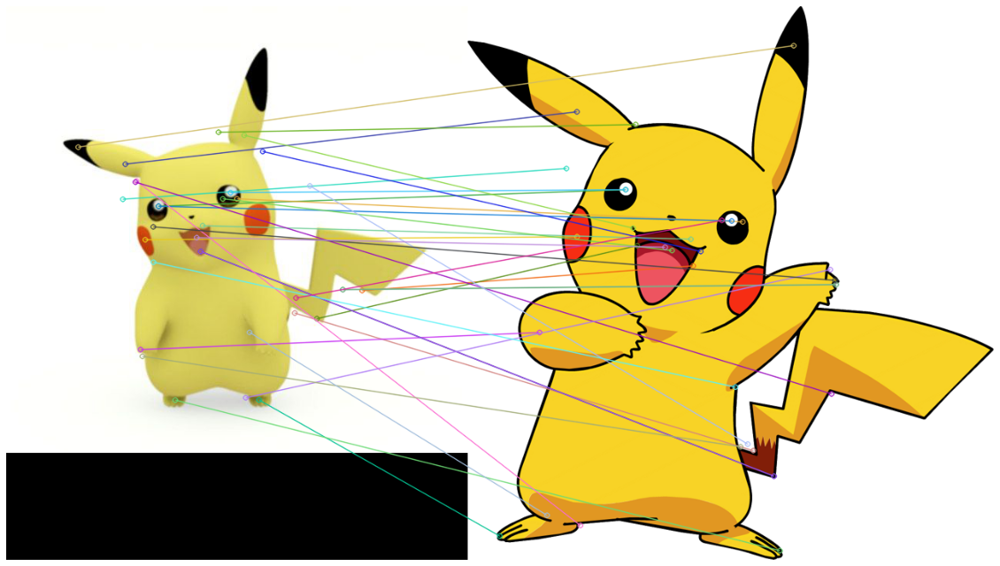

In [19]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

As we can see in this example ORB algorithm detected over 500 keypoints from the training and query image compared with SIFT algorithm that detected 152 from the training image and 314 from the query image. Looks like the ORB algorithm surpass the SIFT algorithm by matching 120 keypoints compared with 77 on the SIFT, however we need to consider how much of this matching keypoints are false positives.  

### Example 2 <a class="anchor" id="sample2" ></a>

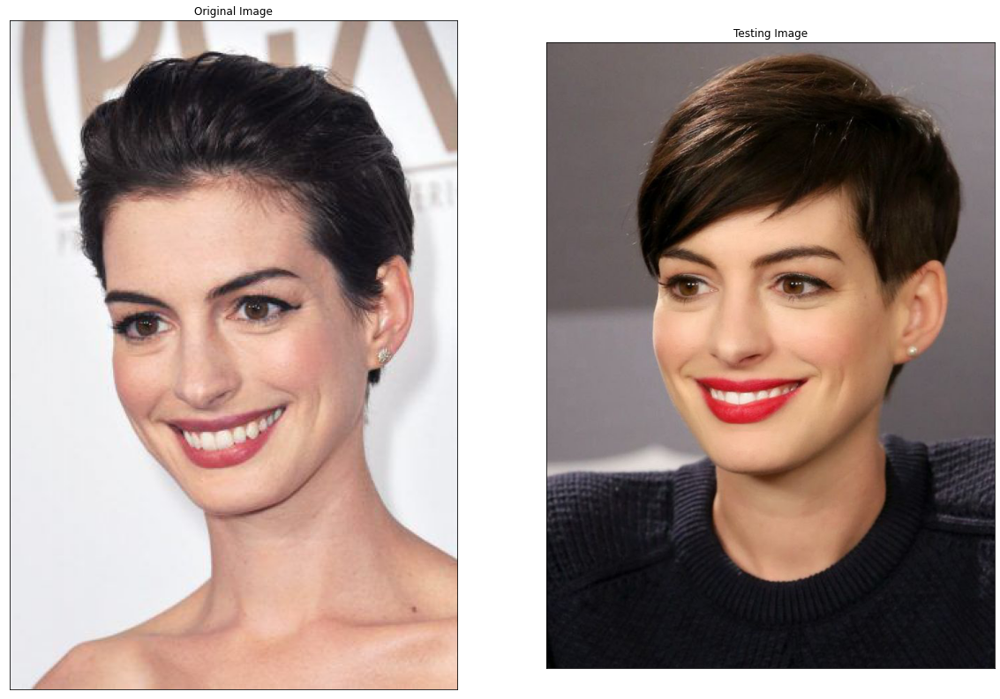

In [20]:
#reading image
img = cv2.imread('data/Anne.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
test_image = cv2.imread('data/Anne_2.jpg')
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

plot_images(img_color, test_image, "Original Image", "Testing Image")

#### Feature Matching with ORB

Number of Keypoints Detected In The Training Image:  498
Number of Keypoints Detected In The Query Image:  500


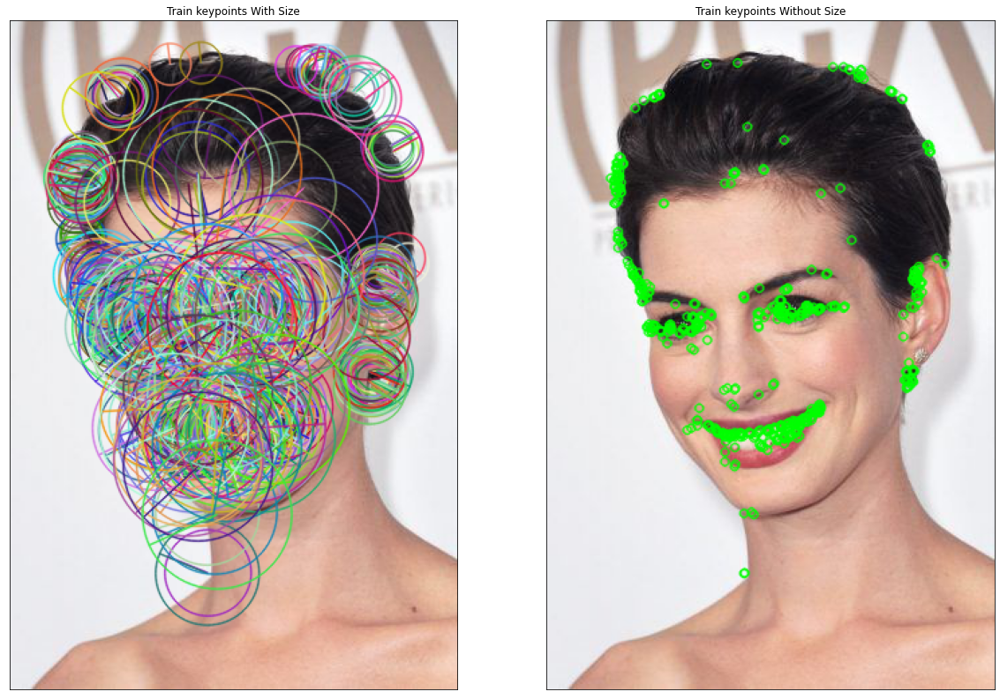

In [21]:
result, matches = ORB(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  130


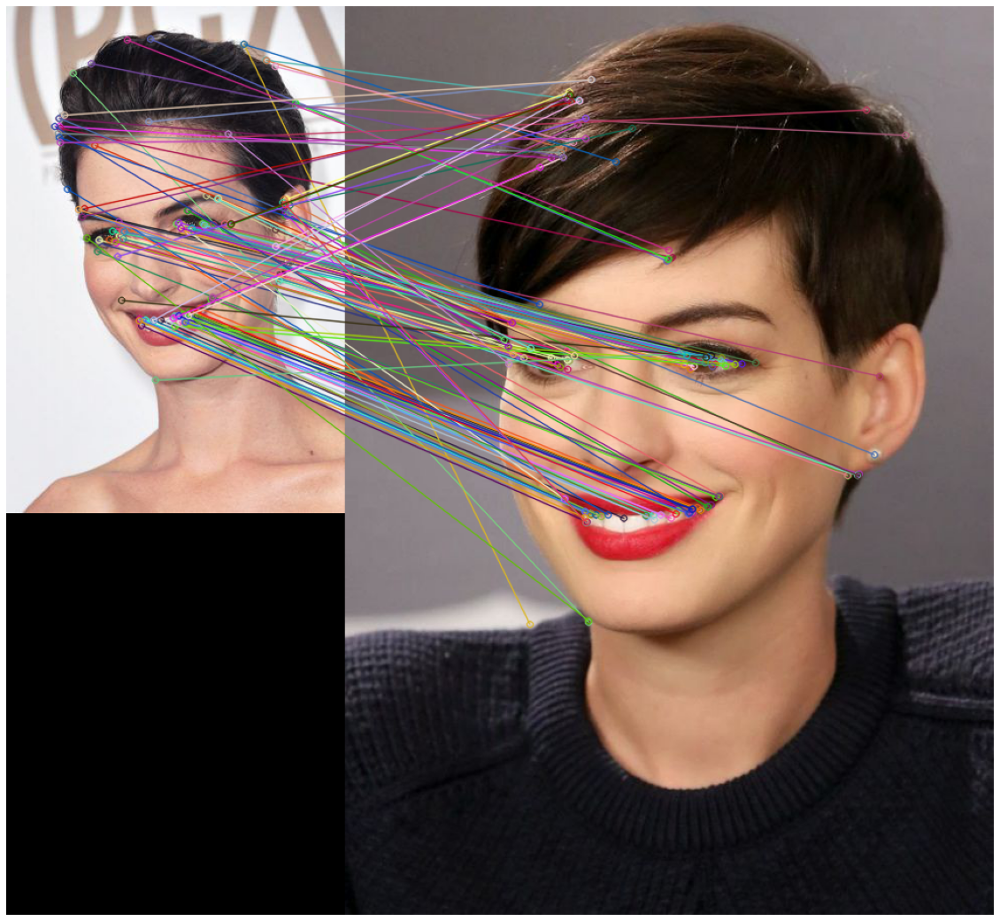

In [22]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

#### Feature Matching with SIFT

Number of Keypoints Detected In The Training Image:  333
Number of Keypoints Detected In The Query Image:  621


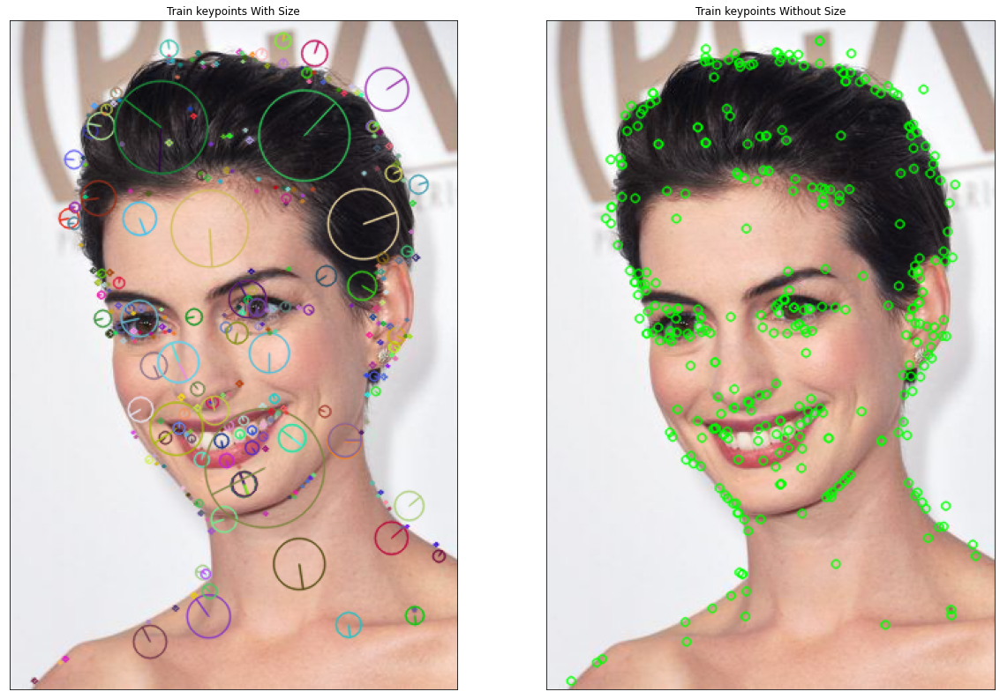

In [23]:
result, matches = SIFT(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  97


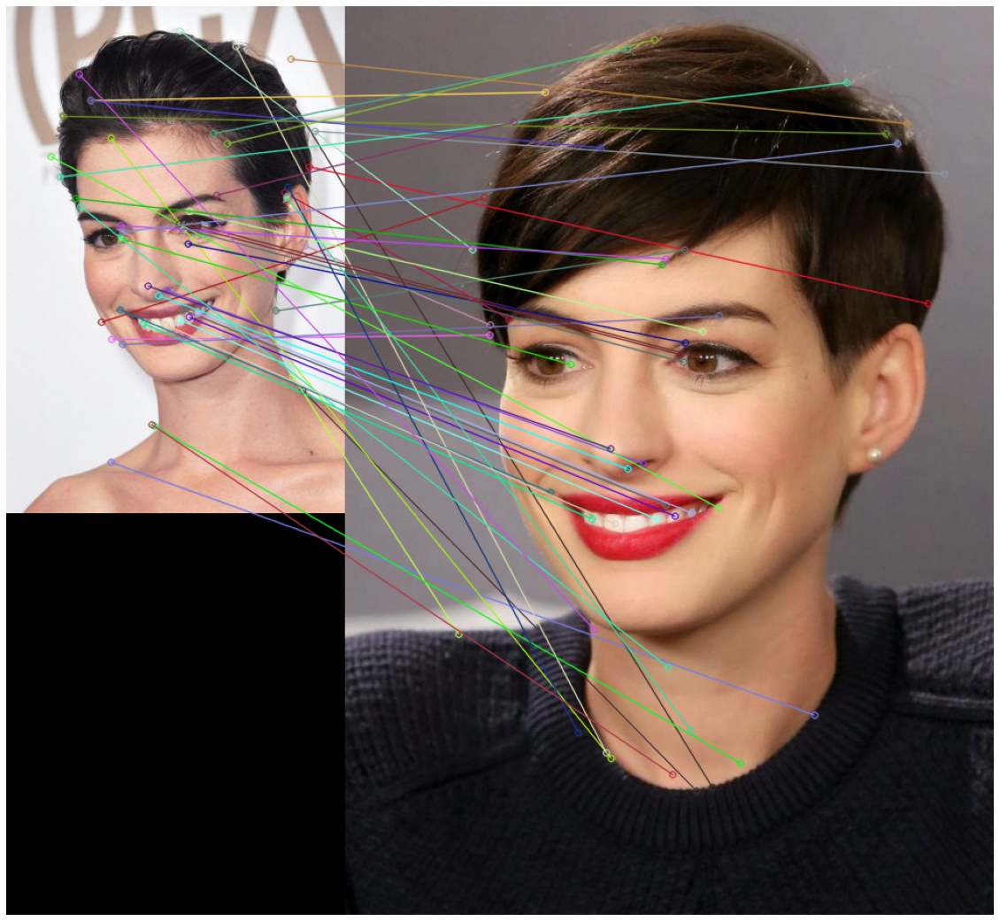

In [24]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

As we can see in this example ORB algorithm detected over 49 keypoints from the training and 500 from the query image compared with SIFT algorithm that detected 333 from the training image and 621 from the query image. Looks like the ORB algorithm surpass the SIFT algorithm by matching 130 keypoints compared with 97 on the SIFT, however we need to consider how much of this matching keypoints are false positives, another interesting finding is that ORB had less keypoints compared with SIFT but matched more of these keypoints in comparison.

### Example 3 <a class="anchor" id="sample3" ></a>

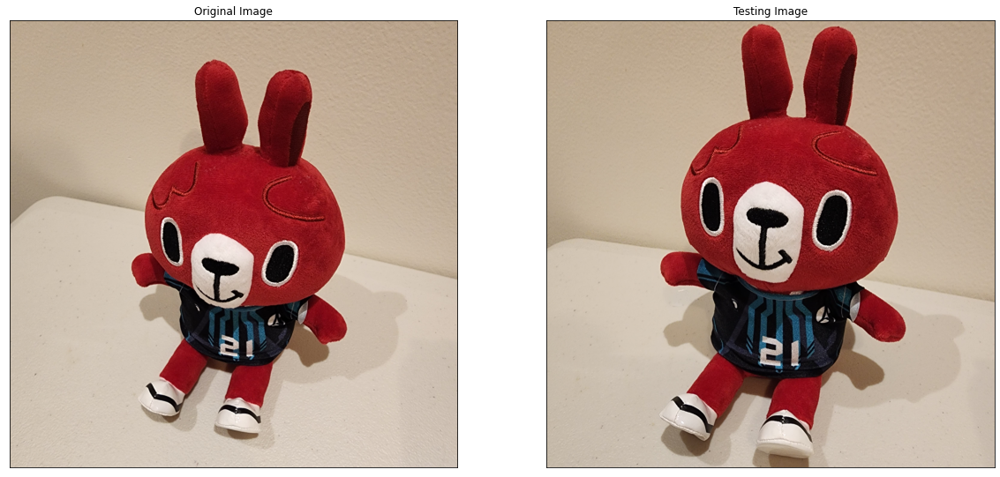

In [25]:
#reading image
img = cv2.imread('data/bunny_5.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
test_image = cv2.imread('data/bunny_6.jpg')
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)


plot_images(img_color, test_image, "Original Image", "Testing Image")

#### Feature Matching with ORB

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  500


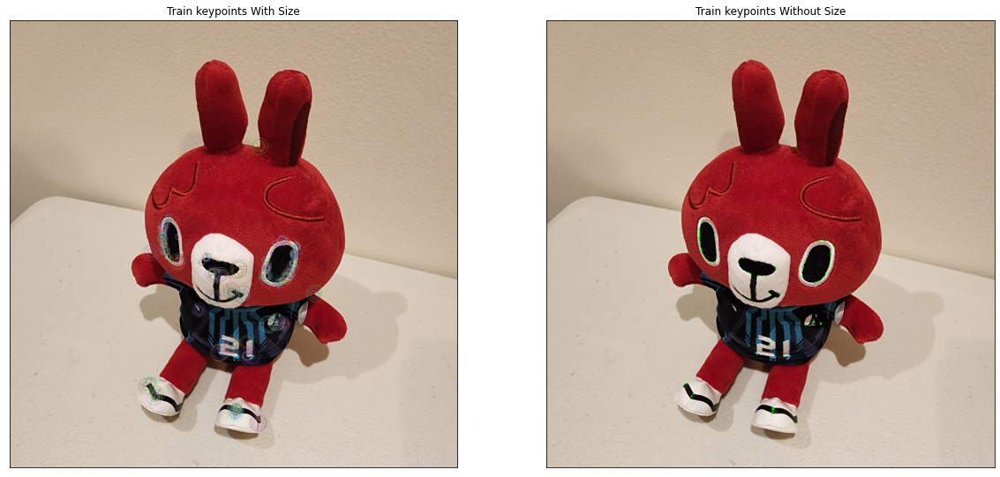

In [26]:
result, matches = ORB(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  161


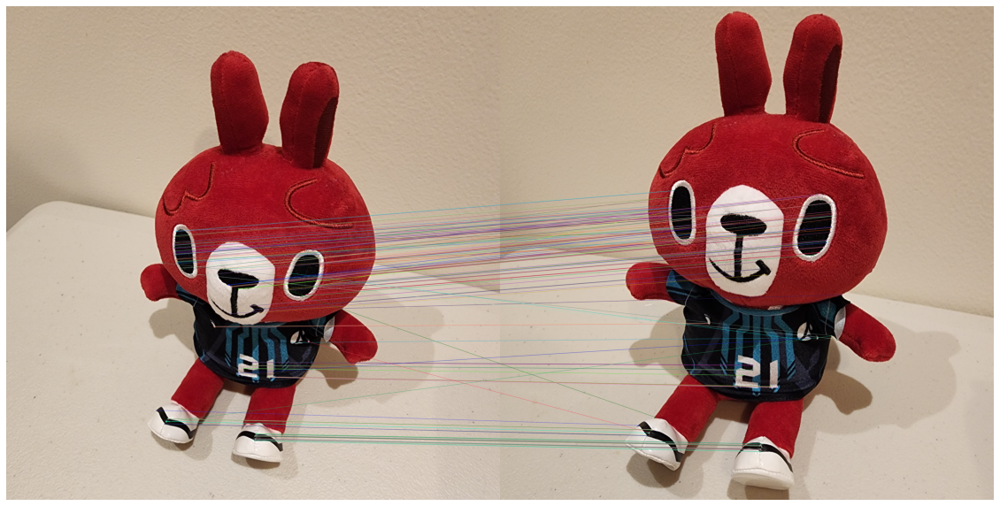

In [27]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

#### Feature Matching with SIFT

Number of Keypoints Detected In The Training Image:  4361
Number of Keypoints Detected In The Query Image:  6650


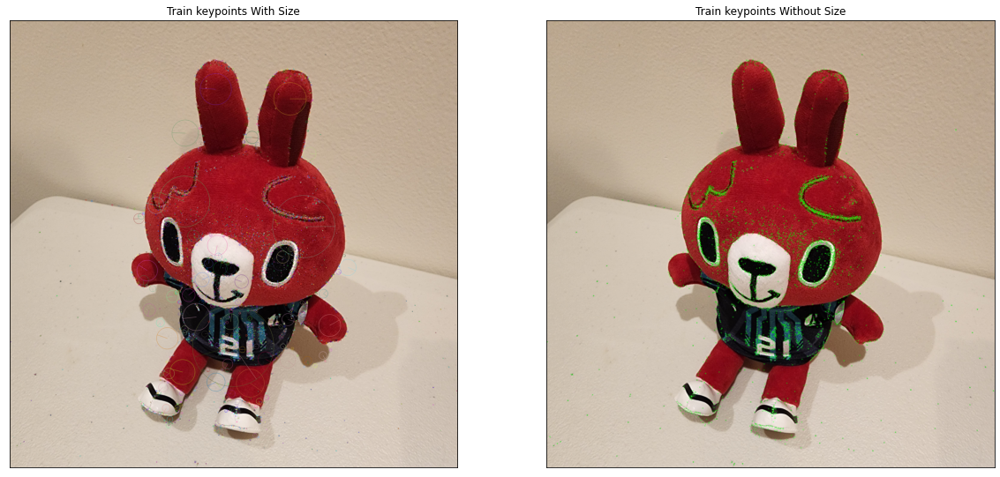

In [28]:
result, matches = SIFT(img_color, test_image)


Number of Matching Keypoints Between The Training and Query Images:  1429


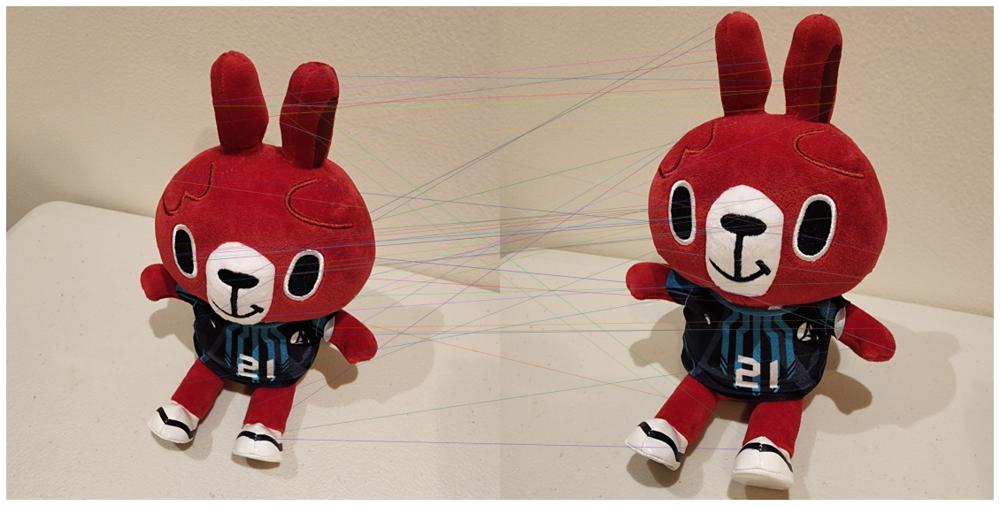

In [29]:
plot_result(result)
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

As we can see in this example ORB algorithm detected over 500 keypoints from the training and query image compared with SIFT algorithm that detected 4361 from the training image and 6650 from the query image. Looks like the SIFT algorithm surpass the ORB algorithm by matching 1429 keypoints compared with 161 on the ORB, however we need to consider how much of this matching keypoints are false positives, another aspect to consider is that we can look to many differences when comparing the ORB vs SIFT in the resulting matching image, we are thinking that the keypoints in the SIFT are very near almost overlapping and that’s the reason why is not very noticeable.

## Conclusion <a class="anchor" id="conclusion" ></a>

In terms of performance, SIFT is generally considered to be more accurate and robust, especially in challenging lighting and geometric conditions. However, it is also slower and more computationally expensive than ORB. ORB is faster and more efficient, but may not perform as well as SIFT in certain scenarios. Several studies have compared the performance of SIFT and ORB. For example, a 2013 study by Zhang et al. found that SIFT outperformed ORB in terms of matching accuracy, but ORB was faster and more efficient. Another study by Chen et al. in 2015 also found that SIFT was more accurate than ORB, but ORB was faster.

For this examples was difficult to determine which is the better algorithm, however, the choice of which algorithm to use depends on the specific requirements of the application. If high accuracy and robustness are critical, SIFT may be a better choice, even if it is slower and more computationally expensive. However, if speed is a critical factorand some trade-offs in accuracy and robustness can be accepted, ORB may be a better choice.

## References <a class="anchor" id="references" ></a>

[1] Chen, J., Li, J., Jiao, L., & Liu, W. (2015). Comparing and evaluating SIFT and ORB feature extraction and matching algorithm based on the different matching strategies. In Proceedings of the 3rd International Conference on Multimedia Technology (ICMT 2015) (pp. 64-68). ACM.

[2] Gonzalez, R. C., & Woods, R. E. (2018). Digital image processing (Fourth edition.). Pearson.

[3] Lowe, D. G. (2004). Distinctive image features from scale-invariant keypoints. International journal of computer vision, 60(2), 91-110.

[4] Rublee, E., Rabaud, V., Konolige, K., & Bradski, G. (2011, November). ORB: An efficient alternative to SIFT or SURF. In 2011 International Conference on Computer Vision (pp. 2564-2571). IEEE.

[5] Zhang, H., Wei, J., Zhang, J., & Chen, W. (2013). Evaluation of local feature descriptors and their combinations for visual tracking. International Journal of Advanced Robotic Systems, 10(1), 1-9.
